# TensorFlow Hub - Object detection

## Importing the libraries

In [1]:
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import tensorflow as tf
import tensorflow_hub as hub
print("TensorFlow version:", tf.__version__)
print("TensorFlow Hub version:", tf.__version__)

TensorFlow version: 2.16.1
TensorFlow Hub version: 2.16.1


## TensorFlow Hub settings

In [2]:
# The models path that we can use
model_paths = {
'CenterNet HourGlass104 512x512' : 'https://tfhub.dev/tensorflow/centernet/hourglass_512x512/1',
'CenterNet HourGlass104 Keypoints 512x512' : 'https://tfhub.dev/tensorflow/centernet/hourglass_512x512_kpts/1',
'CenterNet HourGlass104 1024x1024' : 'https://tfhub.dev/tensorflow/centernet/hourglass_1024x1024/1',
'CenterNet HourGlass104 Keypoints 1024x1024' : 'https://tfhub.dev/tensorflow/centernet/hourglass_1024x1024_kpts/1',
'CenterNet Resnet50 V1 FPN 512x512' : 'https://tfhub.dev/tensorflow/centernet/resnet50v1_fpn_512x512/1',
'CenterNet Resnet50 V1 FPN Keypoints 512x512' : 'https://tfhub.dev/tensorflow/centernet/resnet50v1_fpn_512x512_kpts/1',
'CenterNet Resnet101 V1 FPN 512x512' : 'https://tfhub.dev/tensorflow/centernet/resnet101v1_fpn_512x512/1',
'CenterNet Resnet50 V2 512x512' : 'https://tfhub.dev/tensorflow/centernet/resnet50v2_512x512/1',
'CenterNet Resnet50 V2 Keypoints 512x512' : 'https://tfhub.dev/tensorflow/centernet/resnet50v2_512x512_kpts/1',
'EfficientDet D0 512x512' : 'https://tfhub.dev/tensorflow/efficientdet/d0/1',
'EfficientDet D1 640x640' : 'https://tfhub.dev/tensorflow/efficientdet/d1/1',
'EfficientDet D2 768x768' : 'https://tfhub.dev/tensorflow/efficientdet/d2/1',
'EfficientDet D3 896x896' : 'https://tfhub.dev/tensorflow/efficientdet/d3/1',
'EfficientDet D4 1024x1024' : 'https://tfhub.dev/tensorflow/efficientdet/d4/1',
'EfficientDet D5 1280x1280' : 'https://tfhub.dev/tensorflow/efficientdet/d5/1',
'EfficientDet D6 1280x1280' : 'https://tfhub.dev/tensorflow/efficientdet/d6/1',
'EfficientDet D7 1536x1536' : 'https://tfhub.dev/tensorflow/efficientdet/d7/1',
'SSD MobileNet v2 320x320' : 'https://tfhub.dev/tensorflow/ssd_mobilenet_v2/2',
'SSD MobileNet V1 FPN 640x640' : 'https://tfhub.dev/tensorflow/ssd_mobilenet_v1/fpn_640x640/1',
'SSD MobileNet V2 FPNLite 320x320' : 'https://tfhub.dev/tensorflow/ssd_mobilenet_v2/fpnlite_320x320/1',
'SSD MobileNet V2 FPNLite 640x640' : 'https://tfhub.dev/tensorflow/ssd_mobilenet_v2/fpnlite_640x640/1',
'SSD ResNet50 V1 FPN 640x640 (RetinaNet50)' : 'https://tfhub.dev/tensorflow/retinanet/resnet50_v1_fpn_640x640/1',
'SSD ResNet50 V1 FPN 1024x1024 (RetinaNet50)' : 'https://tfhub.dev/tensorflow/retinanet/resnet50_v1_fpn_1024x1024/1',
'SSD ResNet101 V1 FPN 640x640 (RetinaNet101)' : 'https://tfhub.dev/tensorflow/retinanet/resnet101_v1_fpn_640x640/1',
'SSD ResNet101 V1 FPN 1024x1024 (RetinaNet101)' : 'https://tfhub.dev/tensorflow/retinanet/resnet101_v1_fpn_1024x1024/1',
'SSD ResNet152 V1 FPN 640x640 (RetinaNet152)' : 'https://tfhub.dev/tensorflow/retinanet/resnet152_v1_fpn_640x640/1',
'SSD ResNet152 V1 FPN 1024x1024 (RetinaNet152)' : 'https://tfhub.dev/tensorflow/retinanet/resnet152_v1_fpn_1024x1024/1',
'Faster R-CNN ResNet50 V1 640x640' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet50_v1_640x640/1',
'Faster R-CNN ResNet50 V1 1024x1024' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet50_v1_1024x1024/1',
'Faster R-CNN ResNet50 V1 800x1333' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet50_v1_800x1333/1',
'Faster R-CNN ResNet101 V1 640x640' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet101_v1_640x640/1',
'Faster R-CNN ResNet101 V1 1024x1024' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet101_v1_1024x1024/1',
'Faster R-CNN ResNet101 V1 800x1333' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet101_v1_800x1333/1',
'Faster R-CNN ResNet152 V1 640x640' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet152_v1_640x640/1',
'Faster R-CNN ResNet152 V1 1024x1024' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet152_v1_1024x1024/1',
'Faster R-CNN ResNet152 V1 800x1333' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet152_v1_800x1333/1',
'Faster R-CNN Inception ResNet V2 640x640' : 'https://tfhub.dev/tensorflow/faster_rcnn/inception_resnet_v2_640x640/1',
'Faster R-CNN Inception ResNet V2 1024x1024' : 'https://tfhub.dev/tensorflow/faster_rcnn/inception_resnet_v2_1024x1024/1',
'Mask R-CNN Inception ResNet V2 1024x1024' : 'https://tfhub.dev/tensorflow/mask_rcnn/inception_resnet_v2_1024x1024/1'
}

In [3]:
# We need to clone a github repository
!git clone --depth 1 https://github.com/tensorflow/models

fatal: destination path 'models' already exists and is not an empty directory.


In [ ]:
# Executing some Linux commands to compile some of the files
%%bash
sudo apt install -y protobuf-compiler
cd models/research/
protoc object_detection/protos/*.proto --python_out=.
cp object_detection/packages/tf2/setup.py .
python -m pip install .

In [5]:
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils
from object_detection.utils import ops

In [6]:
path_to_labels = "/content/models/research/object_detection/data/mscoco_label_map.pbtxt"
classes_indices = label_map_util.create_category_index_from_labelmap(path_to_labels, use_display_name = True)

In [7]:
classes_indices

{1: {'id': 1, 'name': 'person'},
 2: {'id': 2, 'name': 'bicycle'},
 3: {'id': 3, 'name': 'car'},
 4: {'id': 4, 'name': 'motorcycle'},
 5: {'id': 5, 'name': 'airplane'},
 6: {'id': 6, 'name': 'bus'},
 7: {'id': 7, 'name': 'train'},
 8: {'id': 8, 'name': 'truck'},
 9: {'id': 9, 'name': 'boat'},
 10: {'id': 10, 'name': 'traffic light'},
 11: {'id': 11, 'name': 'fire hydrant'},
 13: {'id': 13, 'name': 'stop sign'},
 14: {'id': 14, 'name': 'parking meter'},
 15: {'id': 15, 'name': 'bench'},
 16: {'id': 16, 'name': 'bird'},
 17: {'id': 17, 'name': 'cat'},
 18: {'id': 18, 'name': 'dog'},
 19: {'id': 19, 'name': 'horse'},
 20: {'id': 20, 'name': 'sheep'},
 21: {'id': 21, 'name': 'cow'},
 22: {'id': 22, 'name': 'elephant'},
 23: {'id': 23, 'name': 'bear'},
 24: {'id': 24, 'name': 'zebra'},
 25: {'id': 25, 'name': 'giraffe'},
 27: {'id': 27, 'name': 'backpack'},
 28: {'id': 28, 'name': 'umbrella'},
 31: {'id': 31, 'name': 'handbag'},
 32: {'id': 32, 'name': 'tie'},
 33: {'id': 33, 'name': 'suitc

In [8]:
# The list of the models
model_name = 'CenterNet HourGlass104 Keypoints 512x512' # @param ['CenterNet HourGlass104 512x512','CenterNet HourGlass104 Keypoints 512x512','CenterNet HourGlass104 1024x1024','CenterNet HourGlass104 Keypoints 1024x1024','CenterNet Resnet50 V1 FPN 512x512','CenterNet Resnet50 V1 FPN Keypoints 512x512','CenterNet Resnet101 V1 FPN 512x512','CenterNet Resnet50 V2 512x512','CenterNet Resnet50 V2 Keypoints 512x512','EfficientDet D0 512x512','EfficientDet D1 640x640','EfficientDet D2 768x768','EfficientDet D3 896x896','EfficientDet D4 1024x1024','EfficientDet D5 1280x1280','EfficientDet D6 1280x1280','EfficientDet D7 1536x1536','SSD MobileNet v2 320x320','SSD MobileNet V1 FPN 640x640','SSD MobileNet V2 FPNLite 320x320','SSD MobileNet V2 FPNLite 640x640','SSD ResNet50 V1 FPN 640x640 (RetinaNet50)','SSD ResNet50 V1 FPN 1024x1024 (RetinaNet50)','SSD ResNet101 V1 FPN 640x640 (RetinaNet101)','SSD ResNet101 V1 FPN 1024x1024 (RetinaNet101)','SSD ResNet152 V1 FPN 640x640 (RetinaNet152)','SSD ResNet152 V1 FPN 1024x1024 (RetinaNet152)','Faster R-CNN ResNet50 V1 640x640','Faster R-CNN ResNet50 V1 1024x1024','Faster R-CNN ResNet50 V1 800x1333','Faster R-CNN ResNet101 V1 640x640','Faster R-CNN ResNet101 V1 1024x1024','Faster R-CNN ResNet101 V1 800x1333','Faster R-CNN ResNet152 V1 640x640','Faster R-CNN ResNet152 V1 1024x1024','Faster R-CNN ResNet152 V1 800x1333','Faster R-CNN Inception ResNet V2 640x640','Faster R-CNN Inception ResNet V2 1024x1024','Mask R-CNN Inception ResNet V2 1024x1024']

In [9]:
model_path = model_paths[model_name]

In [10]:
print("Model:", model_name)
print("Model Path:", model_path)

Model: CenterNet HourGlass104 Keypoints 512x512
Model Path: https://tfhub.dev/tensorflow/centernet/hourglass_512x512_kpts/1


In [ ]:
model = hub.load(model_path)

## Loading the image

In [12]:
image = Image.open("/content/140896.jpg")

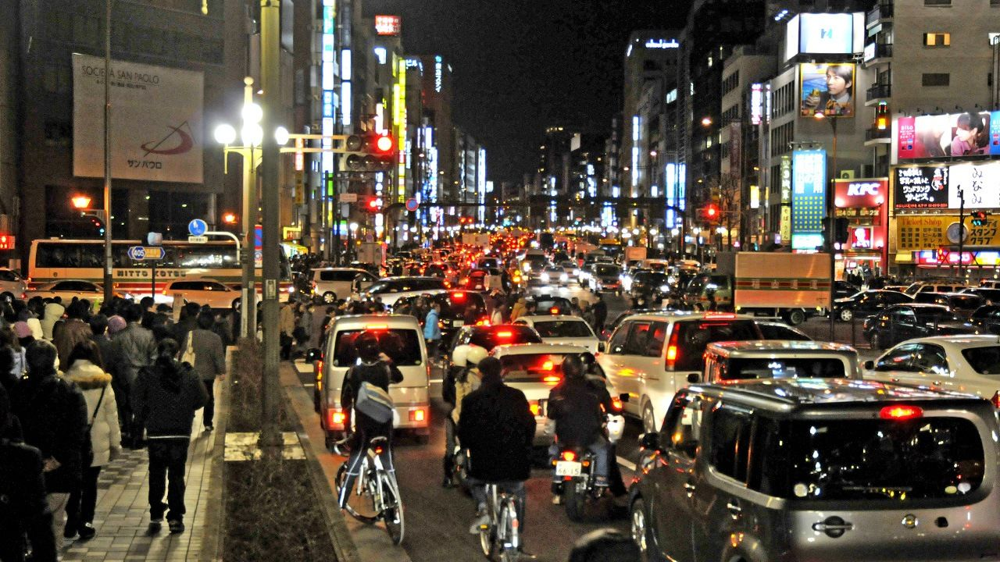

In [13]:
image

In [14]:
image.size

(1280, 720)

In [15]:
type(image)

PIL.JpegImagePlugin.JpegImageFile

In [16]:
# Extracting the width and the height
(width, height) = image.size
print("Image width:", width)
print("Image height:", height)

Image width: 1280
Image height: 720


In [17]:
# We need to convert the image which is in PIL format to Numpy format
# .getdata() to get the values of the pixels then we reshape it
image = np.array(image.getdata()).reshape((1, height, width, 3)).astype(np.uint8)
image.shape

(1, 720, 1280, 3)

In [18]:
type(image)

numpy.ndarray

In [19]:
image

array([[[[ 51,  51,  53],
         [ 51,  51,  53],
         [ 53,  53,  55],
         ...,
         [ 64,  57,  51],
         [ 63,  54,  49],
         [ 65,  56,  51]],

        [[ 52,  52,  54],
         [ 48,  48,  50],
         [ 47,  47,  49],
         ...,
         [ 57,  50,  44],
         [ 64,  55,  50],
         [ 74,  65,  60]],

        [[ 49,  49,  51],
         [ 43,  43,  45],
         [ 41,  41,  43],
         ...,
         [ 64,  57,  51],
         [ 68,  59,  54],
         [ 69,  60,  55]],

        ...,

        [[ 43,  44,  39],
         [ 27,  28,  23],
         [  9,   9,   7],
         ...,
         [ 69,  54,  51],
         [ 67,  52,  49],
         [ 63,  48,  45]],

        [[ 57,  58,  53],
         [ 39,  40,  35],
         [ 18,  19,  14],
         ...,
         [ 84,  69,  64],
         [ 87,  69,  65],
         [ 85,  67,  63]],

        [[ 69,  70,  65],
         [ 50,  51,  46],
         [ 29,  30,  25],
         ...,
         [107,  92,  87],
        

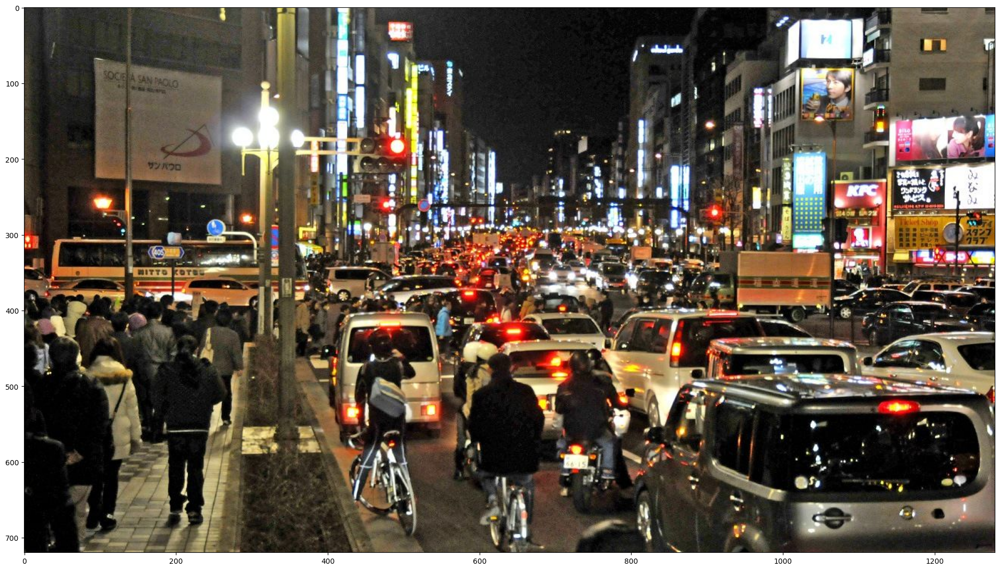

In [20]:
# To be able to visualize it in Google Collab (%matplotlib inline)
%matplotlib inline
plt.figure(figsize = (24, 32))
plt.imshow(image[0])
plt.show()
# Now we can see the image in Numpy format

# Object detection

In [21]:
results = model(image)

In [22]:
results

{'num_detections': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([100.], dtype=float32)>,
 'detection_keypoint_scores': <tf.Tensor: shape=(1, 100, 17), dtype=float32, numpy=
 array([[[0.10152959, 0.1       , 0.1       , ..., 0.762072  ,
          0.5865314 , 0.76197696],
         [0.1       , 0.1       , 0.1       , ..., 0.73435485,
          0.45381308, 0.4127039 ],
         [0.        , 0.        , 0.        , ..., 0.        ,
          0.        , 0.        ],
         ...,
         [0.        , 0.        , 0.        , ..., 0.        ,
          0.        , 0.        ],
         [0.1       , 0.1       , 0.1       , ..., 0.1       ,
          0.10980357, 0.1       ],
         [0.1       , 0.1       , 0.1       , ..., 0.1       ,
          0.1       , 0.1       ]]], dtype=float32)>,
 'detection_keypoints': <tf.Tensor: shape=(1, 100, 17, 2), dtype=float32, numpy=
 array([[[[0.62555915, 0.17221141],
          [0.629637  , 0.16219214],
          [0.62681085, 0.16803956],
          .

In [23]:
print(classes_indices[1])
print(classes_indices[10])
print(classes_indices[3])
print(classes_indices[31])

{'id': 1, 'name': 'person'}
{'id': 10, 'name': 'traffic light'}
{'id': 3, 'name': 'car'}
{'id': 31, 'name': 'handbag'}


In [24]:
# To show the only items we need
result = {key:value.numpy() for key, value in results.items()}
print(result.keys())

dict_keys(['num_detections', 'detection_keypoint_scores', 'detection_keypoints', 'detection_boxes', 'detection_scores', 'detection_classes'])


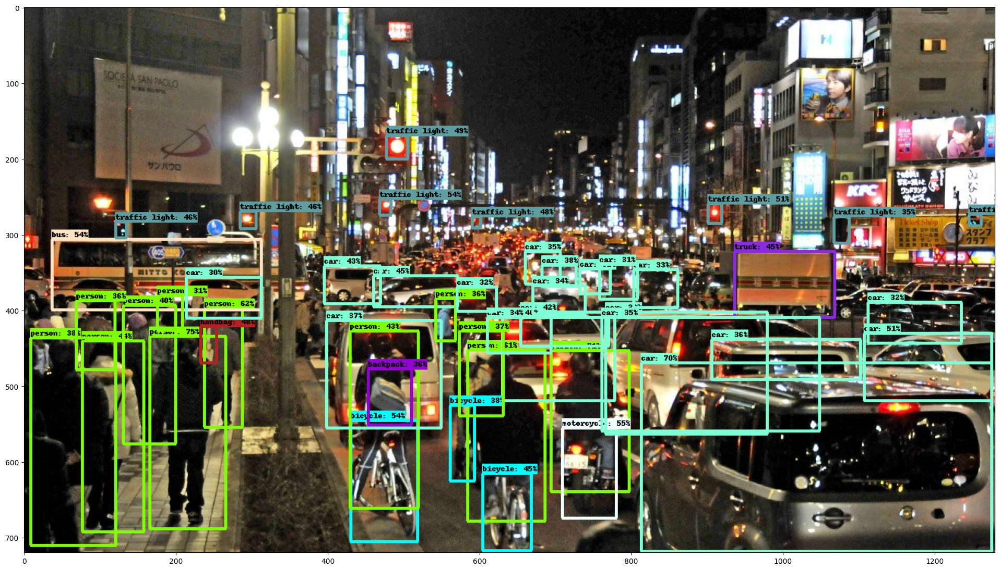

In [25]:
image_detection = image.copy()
visualization_utils.visualize_boxes_and_labels_on_image_array(
    image_detection[0],
    result['detection_boxes'][0],
    (result['detection_classes'][0]).astype(int),
    result['detection_scores'][0],
    classes_indices,
    max_boxes_to_draw = 200,
    use_normalized_coordinates=True,
    min_score_thresh=.30
)
plt.figure(figsize=(24,32))
plt.imshow(image_detection[0])
plt.show()

In [26]:
print("THANK YOU!")

THANK YOU!
